In [703]:
import pandas as pd
import numpy as np
from random import *
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
import warnings
warnings.filterwarnings("ignore")

In [704]:
from google.colab import files
files.upload()

Saving clean_kaggle_data_2022.csv to clean_kaggle_data_2022 (1).csv


{'clean_kaggle_data_2022 (1).csv': b'Duration (in seconds),Q2,Q3,Q4,Q5,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,Q6_6,Q6_7,Q6_8,Q6_9,Q6_10,Q6_11,Q6_12,Q7_1,Q7_2,Q7_3,Q7_4,Q7_5,Q7_6,Q7_7,Q8,Q9,Q10_1,Q10_2,Q10_3,Q11,Q12_1,Q12_2,Q12_3,Q12_4,Q12_5,Q12_6,Q12_7,Q12_8,Q12_9,Q12_10,Q12_11,Q12_12,Q12_13,Q12_14,Q12_15,Q13_1,Q13_2,Q13_3,Q13_4,Q13_5,Q13_6,Q13_7,Q13_8,Q13_9,Q13_10,Q13_11,Q13_12,Q13_13,Q13_14,Q14_1,Q14_2,Q14_3,Q14_4,Q14_5,Q14_6,Q14_7,Q14_8,Q14_9,Q14_10,Q14_11,Q14_12,Q14_13,Q14_14,Q14_15,Q14_16,Q15_1,Q15_2,Q15_3,Q15_4,Q15_5,Q15_6,Q15_7,Q15_8,Q15_9,Q15_10,Q15_11,Q15_12,Q15_13,Q15_14,Q15_15,Q16,Q17_1,Q17_2,Q17_3,Q17_4,Q17_5,Q17_6,Q17_7,Q17_8,Q17_9,Q17_10,Q17_11,Q17_12,Q17_13,Q17_14,Q17_15,Q18_1,Q18_2,Q18_3,Q18_4,Q18_5,Q18_6,Q18_7,Q18_8,Q18_9,Q18_10,Q18_11,Q18_12,Q18_13,Q18_14,Q19_1,Q19_2,Q19_3,Q19_4,Q19_5,Q19_6,Q19_7,Q19_8,Q20_1,Q20_2,Q20_3,Q20_4,Q20_5,Q20_6,Q21_1,Q21_2,Q21_3,Q21_4,Q21_5,Q21_6,Q21_7,Q21_8,Q21_9,Q21_10,Q22,Q23,Q24,Q25,Q26,Q27,Q28_1,Q28_2,Q28_3,Q28_4,Q28_5,Q28_6,Q28_7,Q28_8,Q29,Q30,Q31_1

In [744]:
salaries = pd.read_csv("./clean_kaggle_data_2022.csv", low_memory = False, encoding = 'latin2')
salaries.shape

(8137, 298)

In [745]:
salaries.head()

,Duration (in seconds),Q2,Q3,Q4,Q5,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,...,Q44_5,Q44_6,Q44_7,Q44_8,Q44_9,Q44_10,Q44_11,Q44_12,Q29_Encoded,Q29_buckets
0,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,In which country do you currently reside?,"Are you currently a student? (high school, uni...",On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,NaN,NaN
1,851,55-59,Man,France,No,Coursera,NaN,Kaggle Learn Courses,NaN,NaN,...,"Course Forums (forums.fast.ai, Coursera forums...",NaN,NaN,"Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,2.0,"20,000-29,999"
2,501,30-34,Man,Germany,No,Coursera,edX,NaN,NaN,NaN,...,NaN,"YouTube (Kaggle YouTube, Cloud AI Adventures, ...",NaN,"Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,10.0,"100,000-124,999"
3,787,70+,Man,Australia,No,Coursera,NaN,Kaggle Learn Courses,NaN,NaN,...,NaN,NaN,"Podcasts (Chai Time Data Science, OEEReilly...",NaN,NaN,NaN,NaN,NaN,10.0,"100,000-124,999"
4,1132,40-44,Man,United States of America,No,Coursera,NaN,Kaggle Learn Courses,NaN,Fast.ai,...,NaN,NaN,"Podcasts (Chai Time Data Science, OEEReilly...","Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,13.0,"200,000-299,999"


# Question 1: Data Cleaning

Heat map to visually see the missing columns

<Axes: >

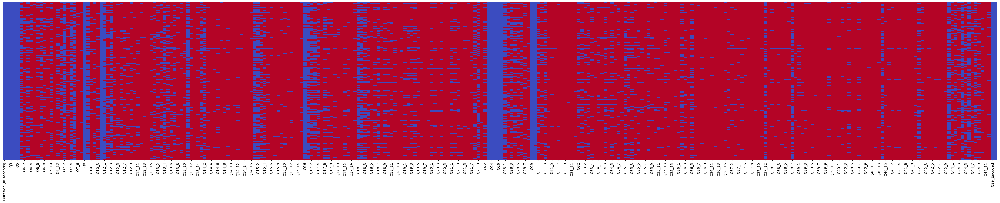

In [746]:
fig, ax = plt.subplots(figsize=(50,8))
sns.heatmap(salaries.isnull(), cmap='coolwarm', yticklabels=False, cbar=False, ax=ax)

Fix 'Q26' due to error in the .CSV file

In [747]:
# Define a function to correct the experience values
def correct_experience(value):
    # Check if the value is a string and contains a hyphen
    if isinstance(value, str) and '-' in value:
        start, end = value.split('-')

        # Dictionary to map month names to their numeric equivalents
        month_to_num = {
            "Jan": "1", "Feb": "2", "Mar": "3", "Apr": "4",
            "May": "5", "Jun": "6", "Jul": "7", "Aug": "8",
            "Sep": "9", "Oct": "10", "Nov": "11", "Dec": "12"
        }

        # Use dictionary to convert the end part if it's a month
        end = month_to_num.get(end, end)

        # Convert start and end to integers and ensure start <= end
        start, end = sorted([int(start), int(end)])

        return f"{start} - {end}"

    return value  # Return original value if not matching the pattern

# Apply the correction to the 'Q26' column
salaries['Q26'] = salaries['Q26'].apply(correct_experience)

# Display unique values in the column
print("Unique values in the column:", salaries['Q26'].unique())


Unique values in the column: ['Approximately how many individuals are responsible for data science workloads at your place of business?'
 '1 - 2' '20+' '3 - 4' '5 - 9' '0' '10 - 14' '15 - 19']


- Drop the second row since it is about the question details
- Drop other information too if they are irrelevant to the task

In [748]:
def CleanData(df):
    # Drop the first row (question details)
    df.drop(df.index[0], inplace=True)
    # Drop the duration column as its irrelevant to the task
    df.drop('Duration (in seconds)', axis = 1, inplace=True)
    #Drop Are you currently a student? (high school, university, or graduate) since all the response are the same
    df.drop('Q5', axis = 1, inplace=True)
    #Drop What is your current yearly compensation (approximate $USD)? since this is technically the target varilable
    df.drop('Q29', axis = 1, inplace=True)
    #Drop columsn which have more than 95% missing values
    high_missing_cols = salaries.columns[salaries.isnull().mean() > 0.95]
    df = salaries.drop(columns=high_missing_cols)
    return df

salaries = CleanData(salaries)
salaries.shape

(8136, 163)

In [749]:
print(salaries.columns)
salaries.head()

Index(['Q2', 'Q3', 'Q4', 'Q6_1', 'Q6_2', 'Q6_3', 'Q6_4', 'Q6_5', 'Q6_6',
       'Q6_7',
       ...
       'Q44_3', 'Q44_4', 'Q44_5', 'Q44_6', 'Q44_7', 'Q44_8', 'Q44_9', 'Q44_10',
       'Q29_Encoded', 'Q29_buckets'],
      dtype='object', length=163)


,Q2,Q3,Q4,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,Q6_6,Q6_7,...,Q44_3,Q44_4,Q44_5,Q44_6,Q44_7,Q44_8,Q44_9,Q44_10,Q29_Encoded,Q29_buckets
1,55-59,Man,France,Coursera,NaN,Kaggle Learn Courses,NaN,NaN,NaN,Udemy,...,NaN,"Kaggle (notebooks, forums, etc)","Course Forums (forums.fast.ai, Coursera forums...",NaN,NaN,"Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,2.0,"20,000-29,999"
2,30-34,Man,Germany,Coursera,edX,NaN,NaN,NaN,Udacity,Udemy,...,"Reddit (r/machinelearning, etc)",NaN,NaN,"YouTube (Kaggle YouTube, Cloud AI Adventures, ...",NaN,"Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,10.0,"100,000-124,999"
3,70+,Man,Australia,Coursera,NaN,Kaggle Learn Courses,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,"Podcasts (Chai Time Data Science, OEEReilly...",NaN,NaN,NaN,10.0,"100,000-124,999"
4,40-44,Man,United States of America,Coursera,NaN,Kaggle Learn Courses,NaN,Fast.ai,Udacity,Udemy,...,NaN,NaN,NaN,NaN,"Podcasts (Chai Time Data Science, OEEReilly...","Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,13.0,"200,000-299,999"
5,40-44,Man,United States of America,Coursera,NaN,NaN,NaN,NaN,Udacity,Udemy,...,NaN,NaN,NaN,NaN,"Podcasts (Chai Time Data Science, OEEReilly...","Blogs (Towards Data Science, Analytics Vidhya,...","Journal Publications (peer-reviewed journals, ...",NaN,13.0,"200,000-299,999"


###**Impute missing values (single column responses)**

1. Identify columns with single column responses

2. Address missing values in those columns

In [750]:
import numpy as np

def ImputingSingleColMissingValues(df):
    # Automatically identify single-column responses by excluding multi-column patterns
    multi_column_prefixes = {col.split('_')[0] for col in df.columns if '_' in col}
    single_col_names = [col for col in df.columns if col.split('_')[0] not in multi_column_prefixes]

    # Manually add Q29_Encoded and Q29_buckets
    single_col_names += ['Q29_Encoded', 'Q29_buckets']

    print("Percentage of null values before imputation:")
    print(df[single_col_names].isnull().sum() * 100 / len(df))

    # Fill missing values in each single-column response based on Q29_Encoded groups
    for col in single_col_names:
        if df[col].isnull().sum() > 0:
            # Compute the mode for each Q29_Encoded group
            mode_per_group = df.groupby('Q29_Encoded')[col].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else np.nan)
            # Fill missing values in the original dataframe based on these modes
            df[col] = df[col].fillna(df['Q29_Encoded'].map(mode_per_group))

    print("Percentage of null values after imputation (make sure they are all zeros):")
    print(df[single_col_names].isnull().sum() * 100 / len(df))
    assert df[single_col_names].isnull().values.sum() == 0, \
        "There are still missing values remaining!"

    return df

# Apply the function
salaries = ImputingSingleColMissingValues(salaries)


Percentage of null values before imputation:
Q2              0.000000
Q3              0.000000
Q4              0.000000
Q8              0.000000
Q9             36.147984
Q11             0.000000
Q16             8.407080
Q22            80.162242
Q23             0.000000
Q24             0.000000
Q25             0.000000
Q26             0.000000
Q27             0.000000
Q30             0.614553
Q32            77.126352
Q43            45.759587
Q29_Encoded     0.000000
Q29_buckets     0.000000
dtype: float64
Percentage of null values after imputation (make sure they are all zeros):
Q2             0.0
Q3             0.0
Q4             0.0
Q8             0.0
Q9             0.0
Q11            0.0
Q16            0.0
Q22            0.0
Q23            0.0
Q24            0.0
Q25            0.0
Q26            0.0
Q27            0.0
Q30            0.0
Q32            0.0
Q43            0.0
Q29_Encoded    0.0
Q29_buckets    0.0
dtype: float64


In [751]:
import pandas as pd
import re

def EncodeSingleColumnResponses(df):
    # Define custom ordinal mappings for each specified column
    ordinal_mappings = {
        'Q2': ['18-21', '22-24', '25-29', '30-34', '35-39', '40-44', '45-49', '50-54', '55-59', '60-69', '70+'],
        'Q11': ['I have never written code','< 1 years', '1-3 years', '3-5 years', '5-10 years', '10-20 years', '20+ years'],
        'Q16': ['I do not use machine learning methods','Under 1 year','1-2 years', '2-3 years','3-4 years', '4-5 years','5-10 years', '10-20 years'],
        'Q25': ['0-49 employees', '50-249 employees', '250-999 employees', '1000-9,999 employees', '10,000 or more employees'],
        'Q26': ['0','1 - 2', '3 - 4', '5 - 9', '10 - 14', '15 - 19','20+'],
        'Q30': ['$0 ($USD)', '$1-$99', '$100-$999', '$1000-$9,999', '$10,000-$99,999', '$100,000 or more ($USD)'],
        'Q43': ['Unknown','Never', 'Once', '2-5 times', '6-25 times', 'More than 25 times'],

    }

    # Define single column names
    multi_column_prefixes = {col.split('_')[0] for col in df.columns if '_' in col}
    single_col_names = [col for col in df.columns if col.split('_')[0] not in multi_column_prefixes]

    # Identify categorical columns in single_col_names
    categorical_cols = [col for col in single_col_names if df[col].dtype == 'object']

    # List to store range columns
    range_columns = []

    # Encoding
    for col in categorical_cols:
        if col in ordinal_mappings:
            print(f"Applying custom ordinal encoding to column: {col}")

            # Create a mapping from the predefined order in ordinal_mappings
            order = ordinal_mappings[col]
            value_to_code = {value: idx for idx, value in enumerate(order)}

            # Apply the mapping directly to the column
            df[col] = df[col].map(value_to_code)
            range_columns.append(col)
        else:
            print(f"Applying One-Hot Encoding to column: {col}")
            # Apply One-Hot Encoding for other categorical columns
            one_hot = pd.get_dummies(df[col], prefix=col)
            df = pd.concat([df, one_hot], axis=1)
            df.drop(columns=col, inplace=True)  # Drop original column after encoding

    return df, range_columns


salaries, range_cols = EncodeSingleColumnResponses(salaries)

# Display the range columns
print("\nColumns identified as range columns:")
for col in range_cols:
    print(f"- {col}")



Applying custom ordinal encoding to column: Q2
Applying One-Hot Encoding to column: Q3
Applying One-Hot Encoding to column: Q4
Applying One-Hot Encoding to column: Q8
Applying One-Hot Encoding to column: Q9
Applying custom ordinal encoding to column: Q11
Applying custom ordinal encoding to column: Q16
Applying One-Hot Encoding to column: Q22
Applying One-Hot Encoding to column: Q23
Applying One-Hot Encoding to column: Q24
Applying custom ordinal encoding to column: Q25
Applying custom ordinal encoding to column: Q26
Applying One-Hot Encoding to column: Q27
Applying custom ordinal encoding to column: Q30
Applying One-Hot Encoding to column: Q32
Applying custom ordinal encoding to column: Q43

Columns identified as range columns:
- Q2
- Q11
- Q16
- Q25
- Q26
- Q30
- Q43


###**Handling categorical features (multi column responses)**

In [752]:
def handle_multi_column_responses(df):
    # Identify multi-column responses by grouping columns based on prefix before the first underscore
    multi_col_groups = {
        col.split('_')[0]: []
        for col in df.columns if '_' in col
    }
    for col in df.columns:
        if '_' in col:
            prefix = col.split('_')[0]
            multi_col_groups[prefix].append(col)

    # Display identified multi-column response groups
    print("Identified multi-column responses:")
    for prefix, cols in multi_col_groups.items():
        print(f"{prefix}: {cols}")

    # Process each multi-column group by filling NaNs with 0 and converting non-zero values to 1
    for cols in multi_col_groups.values():
        df[cols] = df[cols].fillna(0).applymap(lambda x: 1 if x != 0 else 0)

    return df

# Apply the function to your DataFrame
salaries = handle_multi_column_responses(salaries)


Identified multi-column responses:
Q6: ['Q6_1', 'Q6_2', 'Q6_3', 'Q6_4', 'Q6_5', 'Q6_6', 'Q6_7', 'Q6_8', 'Q6_9', 'Q6_10', 'Q6_12']
Q7: ['Q7_1', 'Q7_2', 'Q7_3', 'Q7_4', 'Q7_5', 'Q7_7']
Q10: ['Q10_1', 'Q10_2', 'Q10_3']
Q12: ['Q12_1', 'Q12_2', 'Q12_3', 'Q12_4', 'Q12_5', 'Q12_6', 'Q12_7', 'Q12_8', 'Q12_9', 'Q12_10', 'Q12_11', 'Q12_15']
Q13: ['Q13_1', 'Q13_2', 'Q13_3', 'Q13_4', 'Q13_5', 'Q13_6', 'Q13_7', 'Q13_8', 'Q13_9', 'Q13_10', 'Q13_11', 'Q13_12', 'Q13_14']
Q14: ['Q14_1', 'Q14_2', 'Q14_6']
Q15: ['Q15_1', 'Q15_2', 'Q15_3', 'Q15_4', 'Q15_5', 'Q15_9']
Q17: ['Q17_1', 'Q17_2', 'Q17_3', 'Q17_4', 'Q17_6', 'Q17_7', 'Q17_8', 'Q17_9', 'Q17_12', 'Q17_13']
Q18: ['Q18_1', 'Q18_2', 'Q18_3', 'Q18_4', 'Q18_6', 'Q18_7', 'Q18_8', 'Q18_9', 'Q18_10', 'Q18_11', 'Q18_12']
Q19: ['Q19_1', 'Q19_2', 'Q19_3', 'Q19_4', 'Q19_5']
Q20: ['Q20_1', 'Q20_2', 'Q20_4']
Q21: ['Q21_1', 'Q21_2', 'Q21_3', 'Q21_8', 'Q21_9']
Q28: ['Q28_1', 'Q28_2', 'Q28_3', 'Q28_4', 'Q28_5', 'Q28_6', 'Q28_7', 'Q28_8']
Q31: ['Q31_1', 'Q31_2', 'Q31

In [753]:
salaries.head()

,Q2,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,Q6_6,Q6_7,Q6_8,Q6_9,...,Q32_ Huawei Cloud,Q32_ IBM Cloud / Red Hat,Q32_ Microsoft Azure,Q32_ Oracle Cloud,Q32_ SAP Cloud,Q32_ Tencent Cloud,Q32_ VMware Cloud,Q32_None were satisfactory,Q32_Other,Q32_They all had a similarly enjoyable developer experience
1,8,1,0,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,3,1,1,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,10,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,5,1,0,1,0,1,1,1,0,0,...,0,0,0,0,0,0,0,0,0,1
5,5,1,0,0,0,0,1,1,0,1,...,0,0,1,0,0,0,0,0,0,0


###**Drop the target variable(s) and get the target variable**

In [754]:
# Make sure there are no missing values remaining in the dataset
assert salaries.isnull().values.sum() == 0, \
    "There are still {} missing values remaining in salaries!".format(
        salaries.isnull().values.sum()
    )

In [755]:
salaries = salaries.drop('Q29_buckets', axis=1) #drop Q29 buckets as Q29 encoded is the target variable


In [756]:
# target = #TODO: get the target variable
# #TODO: Drop the target variables from the feature set

Feature_data = salaries.drop('Q29_Encoded', axis=1)  #Feature dataset(all the columns except for the target data)
Target_data = salaries['Q29_Encoded']  #Target dataset

# Make sure the target variables are not included in the feature set
for col in Feature_data.columns:
    assert 'Q29' not in col, \
        "Target variable ({}) is still in the dataset".format(col)

# Question 2: Exploratory Feature Analysis

- From Question 2 - Question 4, you should **NOT** peek at the test labels in any form!
- Assume that you do not know the target values (Q29_Encoded) on the test set

## Split data into training and test sets

In [757]:
# You can use from sklearn.model_selection.train_test_split()
X_train, X_test, y_train, y_test = train_test_split(Feature_data, Target_data, random_state=98, test_size=0.3, shuffle=True)

## **Feature Engineering/Generation**

- Create new feature(s) using existing features!

In [758]:
#TODO: Create new features (feature generation)

X_train['new_feature1'] = X_train['Q2'] * X_train['Q11'] #Age * years of coding for new feature 1
X_train['new_feature2'] = X_train['Q2'] * X_train['Q16'] #Age * years of ML for new feature 2


In [759]:
print(X_train['new_feature1'].head())
print(X_train['new_feature2'].head())

6644     1
8113     8
3415    25
3769    12
5839     4
Name: new_feature1, dtype: int64
6644     1
8113     8
3415    35
3769    18
5839     4
Name: new_feature2, dtype: int64


## **Feature Selection**

- Select the features based on the criteria of your choice

In [760]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import accuracy_score, f1_score
import numpy as np
import pandas as pd
from sklearn.feature_selection import SelectFromModel


# Initialize components
scaler = StandardScaler()
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Variables to store the best model and parameters
best_model = None
best_params = {}
best_accuracy = 0
best_f1 = 0
best_features = None

# Loop through different values of C and solver
for C in [0.1]: # different c values were used [0.001, 0.01, 0.1, 1, 10] and the best C was 0.1. Therefore, for faster computation, 0.1 was hard-coded in.
    for solver in ['liblinear']:
        model = LogisticRegression(C=C, penalty='l1', solver=solver, max_iter=10000, multi_class='ovr', random_state=42)
        accuracy_scores = []
        f1_scores = []

        # Perform stratified k-fold cross-validation
        for train_idx, val_idx in skf.split(X_train, y_train):
            X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
            y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]

            # Feature scaling
            X_train_fold_scaled = scaler.fit_transform(X_train_fold)
            X_val_fold_scaled = scaler.transform(X_val_fold)

            # Train the model
            model.fit(X_train_fold_scaled, y_train_fold)

            # Make predictions
            predictions = model.predict(X_val_fold_scaled)

            # Calculate metrics
            accuracy_scores.append(accuracy_score(y_val_fold, predictions))
            f1_scores.append(f1_score(y_val_fold, predictions, average='weighted'))

        # Check if the current model has the best performance
        mean_accuracy = np.mean(accuracy_scores)
        mean_f1 = np.mean(f1_scores)

        if mean_f1 > best_f1:
            best_model = model
            best_params = {'C': C, 'solver': solver}
            best_accuracy = mean_accuracy
            best_f1 = mean_f1

# Feature selection using the best model
selector = SelectFromModel(best_model, prefit=True)
best_features = X_train.columns[selector.get_support()].tolist()

# Print results
print("Best parameters:", best_params)
print(f"Best Cross-Validation Accuracy: {best_accuracy:.3f}")
print(f"Best Cross-Validation F1-Score: {best_f1:.3f}")
print("\nSelected features:")
for feature in best_features:
    print(feature)


# Feature importance
feature_importance = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': np.abs(best_model.coef_).mean(axis=0)
})
feature_importance = feature_importance.sort_values('Importance', ascending=False)
print("\nTop 10 features by importance:")
print(feature_importance.head(20))

Best parameters: {'C': 0.1, 'solver': 'liblinear'}
Best Cross-Validation Accuracy: 0.870
Best Cross-Validation F1-Score: 0.871

Selected features:
Q2
Q6_1
Q6_3
Q6_4
Q6_5
Q6_7
Q6_8
Q6_9
Q6_10
Q6_12
Q7_1
Q7_3
Q7_5
Q7_7
Q10_1
Q10_2
Q10_3
Q11
Q12_1
Q12_2
Q12_3
Q12_4
Q12_5
Q12_6
Q12_7
Q12_9
Q12_10
Q12_11
Q12_15
Q13_3
Q13_4
Q13_6
Q13_7
Q13_9
Q13_10
Q13_11
Q14_2
Q14_6
Q15_1
Q15_3
Q15_4
Q15_5
Q15_9
Q16
Q17_1
Q17_3
Q17_4
Q17_8
Q17_13
Q18_4
Q18_7
Q18_8
Q18_11
Q18_12
Q19_1
Q19_3
Q19_4
Q20_1
Q21_1
Q21_3
Q21_8
Q21_9
Q25
Q26
Q28_1
Q28_2
Q28_3
Q28_5
Q28_6
Q28_7
Q28_8
Q30
Q33_3
Q33_4
Q34_1
Q34_3
Q34_4
Q34_7
Q35_1
Q35_2
Q35_8
Q35_11
Q35_14
Q36_2
Q37_5
Q38_1
Q39_1
Q40_4
Q40_7
Q40_14
Q42_1
Q43
Q44_3
Q44_5
Q44_6
Q44_7
Q44_8
Q44_10
Q3_Man
Q3_Nonbinary
Q3_Prefer to self-describe
Q4_Argentina
Q4_Australia
Q4_Bangladesh
Q4_Belgium
Q4_Canada
Q4_Chile
Q4_China
Q4_Colombia
Q4_Ecuador
Q4_Egypt
Q4_Ethiopia
Q4_France
Q4_Germany
Q4_Ghana
Q4_I do not wish to disclose my location
Q4_India
Q4_Indonesia
Q4_Iran, Islamic

In [761]:
# Select top 100 features
selected_features = feature_importance['Feature'].head(100).tolist()

# Print results for top 100 features for ease
print("\nTop 100 features by importance:")
for feature in selected_features:
    print(feature)


Top 100 features by importance:
Q32_ Google Cloud Platform (GCP) 
Q32_ Amazon Web Services (AWS) 
Q9_Yes
Q10_2
Q22_ Kaggle datasets 
Q4_United States of America
Q10_3
Q9_No
Q11
Q10_1
Q30
Q4_Italy
Q2
Q4_Nigeria
Q26
Q34_3
Q22_ Huggingface Models 
Q4_Pakistan
Q4_Ethiopia
Q24_Academics/Education
Q23_Manager (Program, Project, Operations, Executive-level, etc)
Q3_Man
Q27_We have well established ML methods (i.e., models in production for more than 2 years)
Q33_3
Q44_8
Q4_India
Q4_United Kingdom of Great Britain and Northern Ireland
Q4_Spain
Q4_Canada
Q4_France
Q23_Statistician
Q28_5
Q4_Ghana
Q4_Australia
Q18_8
Q12_2
Q4_Egypt
Q12_9
Q17_4
Q14_6
Q23_Data Scientist
Q4_Sri Lanka
Q21_9
Q8_Some college/university study without earning a bachelorEEs degree
Q32_They all had a similarly enjoyable developer experience
Q28_8
Q22_Other storage services (i.e. google drive)
Q32_ Microsoft Azure 
Q14_2
Q28_3
Q35_2
Q4_I do not wish to disclose my location
Q28_1
Q25
Q42_1
Q13_3
Q4_Poland
Q40_14
Q13_7
Q12

## **Visualization**

- Make visualization to better understand your data

Feature importance bar graph

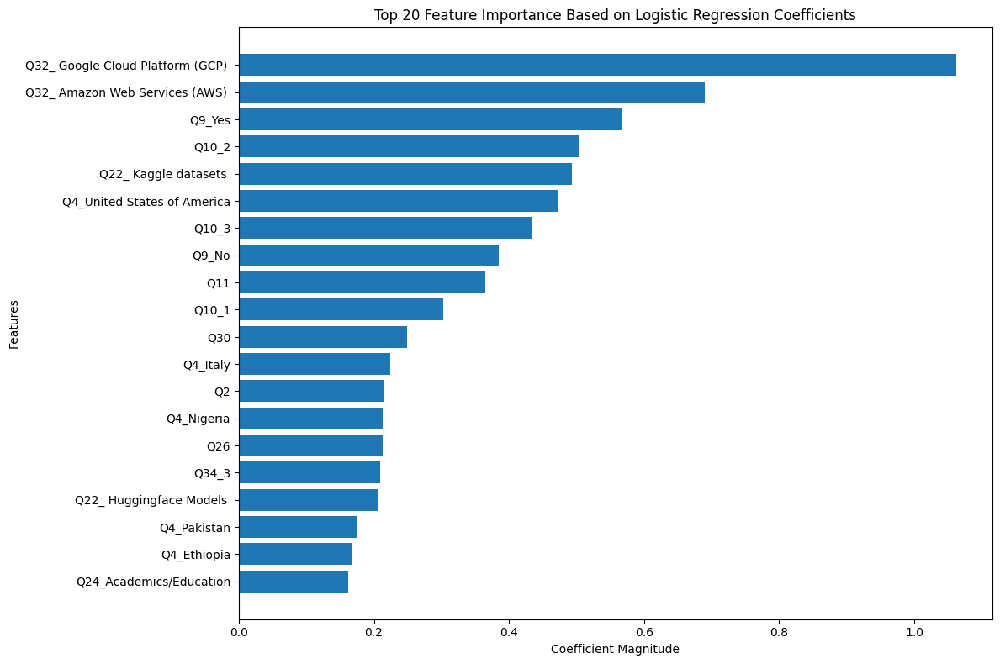

The top 20 features:
['Q32_ Google Cloud Platform (GCP) ', 'Q32_ Amazon Web Services (AWS) ', 'Q9_Yes', 'Q10_2', 'Q22_ Kaggle datasets ', 'Q4_United States of America', 'Q10_3', 'Q9_No', 'Q11', 'Q10_1', 'Q30', 'Q4_Italy', 'Q2', 'Q4_Nigeria', 'Q26', 'Q34_3', 'Q22_ Huggingface Models ', 'Q4_Pakistan', 'Q4_Ethiopia', 'Q24_Academics/Education']


In [762]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Calculate feature importance
feature_importance = pd.DataFrame({
    'feature': X_train.columns,
    'importance': np.abs(best_model.coef_).mean(axis=0)  # For multi-class, take mean of absolute coefficients
})

# Sort features by importance
feature_importance = feature_importance.sort_values('importance', ascending=False)

N = 20
top_features = feature_importance.head(N)

# Create the plot
plt.figure(figsize=(12, 8))
plt.barh(top_features['feature'], top_features['importance'])
plt.xlabel('Coefficient Magnitude')
plt.ylabel('Features')
plt.title(f'Top {N} Feature Importance Based on Logistic Regression Coefficients')
plt.gca().invert_yaxis()  # Invert y-axis to show most important feature at the top
plt.tight_layout()
plt.show()


# Print top features
print("The top 20 features:")
print(feature_importance['feature'].head(20).tolist())

Feature importance heatmap

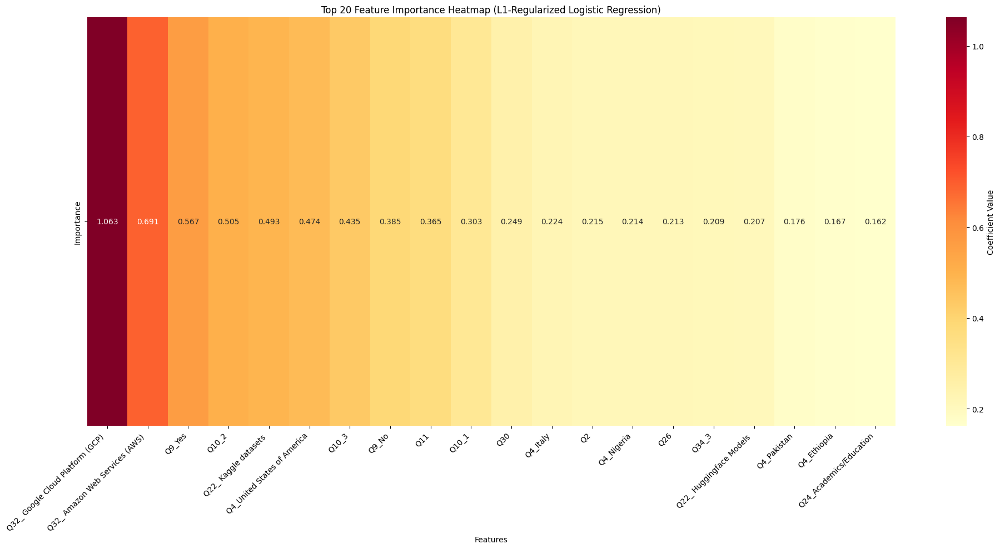

In [763]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Extract coefficients from the best model
coefficients = np.mean(np.abs(best_model.coef_), axis=0)  # For multiclass classification

# Get feature names
feature_names = X_train.columns.tolist()

# Sort features by absolute coefficient value for importance
sorted_idx = np.argsort(np.abs(coefficients))[::-1]  # Reverse order for descending
sorted_features = np.array(feature_names)[sorted_idx]
sorted_coefficients = coefficients[sorted_idx]

# Create a DataFrame from the sorted features and coefficients
importance_df = pd.DataFrame({
    'Feature': sorted_features,
    'Importance': sorted_coefficients
})

# Set the feature names as the index for easier visualization
importance_df.set_index('Feature', inplace=True)

# Select top N features
N = 20
importance_df = importance_df.head(N)

# Plot the heatmap
plt.figure(figsize=(20, 10))
sns.heatmap(importance_df.T, cmap='YlOrRd', annot=True, fmt=".3f",
            cbar_kws={'label': 'Coefficient Value'})
plt.title(f"Top {N} Feature Importance Heatmap (L1-Regularized Logistic Regression)")
plt.xlabel('Features')
plt.ylabel('')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [764]:
X_train_selected = X_train[selected_features]

## **Apply the same feature engineering/selection to test data**

In [765]:
#TODO: Feature generation code you applied to the training data
X_test['new_feature1'] = X_test['Q2'] * X_test['Q11'] #Age * years of coding for new feature 1
X_test['new_feature2'] = X_test['Q2'] * X_test['Q16'] #Age * years of ML for new feature 2

# Leave selected features
X_test_selected = X_test[selected_features]

In [766]:
X_train = X_train_selected.values
X_test = X_test_selected.values
y_train = y_train
y_test = y_test

# Question 3: Model Implementation

## Implement Ordinal Logistic Regression Model

In [767]:
from sklearn.linear_model import LogisticRegression

class OrdinalLogisticRegression():
    # TODO: Add ordinal logreg hyperparameters as args to __init__
    # A dummy hyperparameter is put as a placeholder for now
    def __init__(self, max_iter=100, C=1.0, class_weight='balanced', penalty='l2', solver='liblinear'):
        self.C = C #defulat regularization strength
        self.classes_ = []
        self.models_ = []
        self.max_iter = max_iter
        self.class_weight = class_weight
        self.penalty = penalty
        self.solver = solver

    def fit(self, X, y):
        self.classes_ = sorted(np.unique(y))
        self.models_ = []

        # Train k-1 binary logistic regression models
        for i, c in enumerate(self.classes_[:-1]): # We need only k-1 classifiers
            y_i = (y > c).astype(int)

            model = LogisticRegression(max_iter=self.max_iter, C=self.C, penalty=self.penalty, solver=self.solver, class_weight=self.class_weight)# TODO: what machine learning model should be here?
            model.fit(X, y_i)

            self.models_.append(model)

        return self

    def predict_proba(self, X):
        assert len(self.models_) > 0, "Model is not fitted yet. Run .fit() first."

        # Predicted probabilities for k-1 binary logistic regression models (initialize placeholders)
        binary_probabilities = np.empty((X.shape[0], len(self.models_), 2), dtype=float)

        # Make predictions of k-1 binary logistic regression models
        for i, model in enumerate(self.models_):
            binary_probabilities[:, i] = model.predict_proba(X) #TODO: predicted **probabilities** by the ith binary logistic regression model

        # Compute the probabilities to be in each class
        k = len(self.classes_)
        proba = np.empty((X.shape[0], k), dtype=float) # predicted probabilities for all the data in X (shape=(X.shape[0], k))

        proba[:, 0] = binary_probabilities[:, 0, 0] # 0th probability

        for i in range(1, k-1):
            # ith probability
            # (prob of belonging to class 0 for the ith model - prob of belonging to class 0 for the (i-1)th model
            proba[:, i] = binary_probabilities[:, i, 0] - binary_probabilities[:, i-1, 0]

        proba[:, -1] = binary_probabilities[:, k-2, 1] # (k-1)th probability

        assert (proba.sum(axis=1) == 1).all(), \
            'There is a problem in the probability computation'
        return proba

    def predict(self, X):
        proba = self.predict_proba(X)
        return np.argmax(proba, axis = 1)

    # Add hyperparameters here whenever you add new ones
    # max_iter is added as an example here. key is the hyperparameter name,
    # and value is the attribute name you defined in this class
    def get_params(self, deep=True):
        return {'max_iter': self.max_iter, 'C': self.C, 'class_weight': self.class_weight,'penalty': self.penalty,'solver': self.solver}

    # DO NOT CHANGE
    def set_params(self, **parameters):
        # Set estimator parameters
        for parameter, value in parameters.items():
            setattr(self, parameter, value)
        return self

## Run k-fold cross validation

- Report the average/variance of accuracies across folds

In [768]:
# Convert data to NumPy arrays
X_train_np = np.array(X_train)
y_train_np = np.array(y_train)
X_test_np = np.array(X_test)
y_test_np = np.array(y_test)


In [769]:
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
import numpy as np

# Initialize the OrdinalLogisticRegression model
model = OrdinalLogisticRegression(max_iter=100, C=1.0)

# Set up 10-fold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=98)
accuracies = []

# Perform cross-validation
for train_index, val_index in kf.split(X_train):
    # Split data into training and validation folds
    X_train_fold, X_val_fold = X_train_np[train_index], X_train_np[val_index]
    y_train_fold, y_val_fold = y_train_np[train_index], y_train_np[val_index]

    # Fit the model on the training fold
    model.fit(X_train_fold, y_train_fold)

    # Predict on the validation fold
    y_val_pred = model.predict(X_val_fold)

    # Calculate accuracy for this fold and store it
    accuracy = accuracy_score(y_val_fold, y_val_pred)
    accuracies.append(accuracy)

# Calculate the average and variance of accuracy across folds
average_accuracy = np.mean(accuracies)
variance_accuracy = np.var(accuracies)

print("10-Fold Cross-Validation Results:")
print("Accuracy for each fold:")
for i, score in enumerate(accuracies, start=1):
    print(f"Fold {i}: {score:.4f}")
print("Average accuracy across folds:", average_accuracy)
print("Variance of accuracy across folds:", variance_accuracy)


10-Fold Cross-Validation Results:
Accuracy for each fold:
Fold 1: 0.8860
Fold 2: 0.8877
Fold 3: 0.8474
Fold 4: 0.8632
Fold 5: 0.8684
Fold 6: 0.8682
Fold 7: 0.8682
Fold 8: 0.8717
Fold 9: 0.8629
Fold 10: 0.8682
Average accuracy across folds: 0.8691823143094997
Variance of accuracy across folds: 0.00011865614938044715


F1 Score accuracy before tuning model

In [770]:
from sklearn.model_selection import KFold
from sklearn.metrics import f1_score
import numpy as np

# Initialize the OrdinalLogisticRegression model
model = OrdinalLogisticRegression(max_iter=100, C=1.0)

# 10-fold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=98)
f1_scores = []

# Perform cross-validation
for train_index, val_index in kf.split(X_train):
    # Split data into training and validation folds
    X_train_fold, X_val_fold = X_train_np[train_index], X_train_np[val_index]
    y_train_fold, y_val_fold = y_train_np[train_index], y_train_np[val_index]

    # Fit the model on the training fold
    model.fit(X_train_fold, y_train_fold)

    # Predict on the validation fold
    y_val_pred = model.predict(X_val_fold)

    # Calculate weighted F1 score for this fold and store it
    f1 = f1_score(y_val_fold, y_val_pred, average='weighted')
    f1_scores.append(f1)

# Calculate the average and variance of weighted F1 scores across folds
average_f1_score = np.mean(f1_scores)
variance_f1_score = np.var(f1_scores)

print("10-Fold Cross-Validation Results:")
print("Weighted F1 score for each fold:")
for i, score in enumerate(f1_scores, start=1):
    print(f"Fold {i}: {score:.4f}")
print("Average weighted F1 score across folds:", average_f1_score)
print("Variance of weighted F1 score across folds:", variance_f1_score)


10-Fold Cross-Validation Results:
Weighted F1 score for each fold:
Fold 1: 0.8869
Fold 2: 0.8888
Fold 3: 0.8487
Fold 4: 0.8647
Fold 5: 0.8702
Fold 6: 0.8703
Fold 7: 0.8705
Fold 8: 0.8724
Fold 9: 0.8650
Fold 10: 0.8687
Average weighted F1 score across folds: 0.870631908971865
Variance of weighted F1 score across folds: 0.00011525345550536482


Bias/var trade-off with accuracy as y-axis

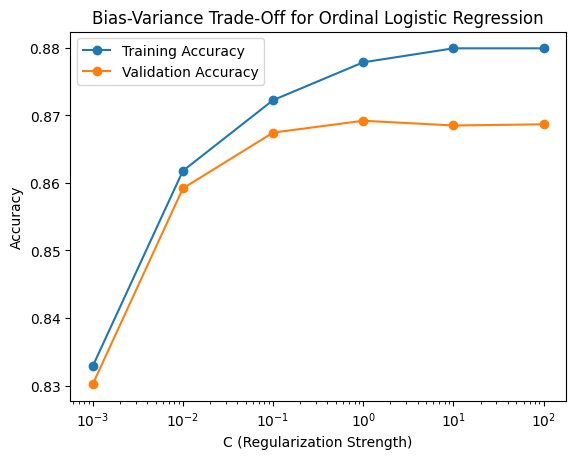

Best C value for bias-variance trade-off: 1


In [771]:
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
import numpy as np
import matplotlib.pyplot as plt

# Define the range of C values to test
C_values = [0.001, 0.01, 0.1, 1, 10, 100]
train_accuracies = []
val_accuracies = []

# Set up 10-fold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=98)

for C in C_values:
    model = OrdinalLogisticRegression(max_iter=10000, C=C)
    train_acc = []
    val_acc = []

    for train_index, val_index in kf.split(X_train):
        X_train_fold, X_val_fold = X_train_np[train_index], X_train_np[val_index]
        y_train_fold, y_val_fold = y_train_np[train_index], y_train_np[val_index]

        # Train the model on the training fold
        model.fit(X_train_fold, y_train_fold)

        # Calculate training accuracy
        y_train_pred = model.predict(X_train_fold)
        train_acc.append(accuracy_score(y_train_fold, y_train_pred))

        # Calculate validation accuracy
        y_val_pred = model.predict(X_val_fold)
        val_acc.append(accuracy_score(y_val_fold, y_val_pred))

    # Store the mean accuracy for each C value
    train_accuracies.append(np.mean(train_acc))
    val_accuracies.append(np.mean(val_acc))

# Plot the bias-variance trade-off
plt.plot(C_values, train_accuracies, label='Training Accuracy', marker='o')
plt.plot(C_values, val_accuracies, label='Validation Accuracy', marker='o')
plt.xscale('log')
plt.xlabel('C (Regularization Strength)')
plt.ylabel('Accuracy')
plt.title('Bias-Variance Trade-Off for Ordinal Logistic Regression')
plt.legend()
plt.show()

# Identify the best C value based on validation accuracy
best_C = C_values[np.argmax(val_accuracies)]
print(f"Best C value for bias-variance trade-off: {best_C}")


## Bias-variance trade-off

[bias_variance_decomp.py](https://github.com/rasbt/mlxtend/blob/master/mlxtend/evaluate/bias_variance_decomp.py)

Below is a function you can use to compute the bias and variance of your ordinal logistic regression model. Using this function, analyze the ordinal logistic regression model performance based on bias-variance trade-off.

In [772]:
### NOTE: You don't need to change anything in this code block! ###

def _draw_bootstrap_sample(rng, X, y):
    sample_indices = np.arange(X.shape[0])
    bootstrap_indices = rng.choice(
        sample_indices, size=sample_indices.shape[0], replace=True
    )
    return X[bootstrap_indices], y[bootstrap_indices]

def bias_variance_decomp(
    estimator,
    X_train,
    y_train,
    X_test,
    y_test,
    num_rounds=10,
    random_seed=0
):
    """
    estimator : object
        A classifier or regressor object or class implementing both a
        `fit` and `predict` method similar to the scikit-learn API.

    X_train : array-like, shape=(num_examples, num_features)
        A training dataset for drawing the bootstrap samples to carry
        out the bias-variance decomposition.

    y_train : array-like, shape=(num_examples)
        Targets (class labels, continuous values in case of regression)
        associated with the `X_train` examples.

    X_test : array-like, shape=(num_examples, num_features)
        The test dataset for computing the average loss, bias,
        and variance.

    y_test : array-like, shape=(num_examples)
        Targets (class labels, continuous values in case of regression)
        associated with the `X_test` examples.

    num_rounds : int (default=10)
        Number of bootstrap rounds (sampling from the training set)
        for performing the bias-variance decomposition. Each bootstrap
        sample has the same size as the original training set.

    random_seed : int (default=0)
        Random seed for the bootstrap sampling used for the
        bias-variance decomposition.

    Returns
    ----------
    avg_bias, avg_var : returns the average bias, and average bias (all floats),
                        where the average is computed over the data points
                        in the test set.

    """
    loss = "mse"

    for ary in (X_train, y_train, X_test, y_test):
        assert type(ary) == np.ndarray, \
            "X_train, y_train, X_test, y_test have to be NumPy array. \
            If e.g., X_train is a pandas DataFrame, convert it to NumPy array \
            via X_train=X_train.values."

    rng = np.random.RandomState(random_seed)

    # All the predictions across different rounds
    all_pred = np.zeros((num_rounds, y_test.shape[0]), dtype=np.float64)

    for i in range(num_rounds):
        # Randomly sample training data
        X_boot, y_boot = _draw_bootstrap_sample(rng, X_train, y_train)

        # Fit the model using the randomly sampled data
        pred = estimator.fit(X_boot, y_boot).predict(X_test)
        all_pred[i] = pred

    # Mean prediction across runs using different dataset for each data point
    main_predictions = np.mean(all_pred, axis=0)

    # Average bias across different rounds
    avg_bias = np.sum((main_predictions - y_test) ** 2) / y_test.size

    # Average variance across different rounds
    avg_var = np.sum((main_predictions - all_pred) ** 2) / all_pred.size

    return avg_bias, avg_var

In [773]:
# Define a range of C values to test
C_values = [0.001, 0.01, 0.1, 0.5,1, 3, 10, 100]
biases = []
variances = []

# Loop over each C value
for C in C_values:
    # Initialize the model with the current C value
    model = OrdinalLogisticRegression(max_iter=10000, C=C)

    # Perform bias-variance decomposition
    avg_bias, avg_var = bias_variance_decomp(model, X_train_np, y_train_np, X_test_np, y_test_np, num_rounds=10, random_seed=98)

    # Store the results
    biases.append(avg_bias)
    variances.append(avg_var)

    # Print the results for the current C value
    print(f"C={C} : Avg Bias: {avg_bias:.4f}, Avg Variance: {avg_var:.4f}")


C=0.001 : Avg Bias: 0.1693, Avg Variance: 0.0100
C=0.01 : Avg Bias: 0.1491, Avg Variance: 0.0090
C=0.1 : Avg Bias: 0.1333, Avg Variance: 0.0127
C=0.5 : Avg Bias: 0.1257, Avg Variance: 0.0158
C=1 : Avg Bias: 0.1238, Avg Variance: 0.0168
C=3 : Avg Bias: 0.1228, Avg Variance: 0.0175
C=10 : Avg Bias: 0.1226, Avg Variance: 0.0178
C=100 : Avg Bias: 0.1225, Avg Variance: 0.0181


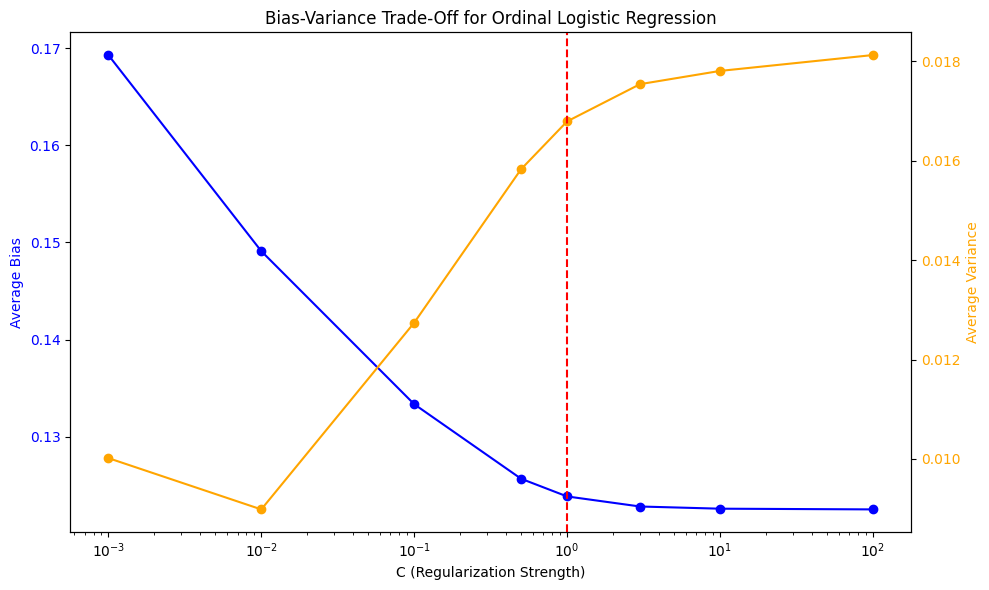

In [774]:
import matplotlib.pyplot as plt

fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot bias with the left y-axis
ax1.plot(C_values, biases, label='Average Bias', color='blue', marker='o')
ax1.set_xscale('log')
ax1.set_xlabel('C (Regularization Strength)')
ax1.set_ylabel('Average Bias', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second y-axis for variance
ax2 = ax1.twinx()
ax2.plot(C_values, variances, label='Average Variance', color='orange', marker='o')
ax2.set_ylabel('Average Variance', color='orange')
ax2.tick_params(axis='y', labelcolor='orange')
plt.axvline(x=1, color='red', linestyle='--', label='C = 10')

# Add title and show the plot
plt.title('Bias-Variance Trade-Off for Ordinal Logistic Regression')
fig.tight_layout()
plt.show()


In [775]:
#TODO: Discuss bias-variance trade-off of your ordinal logistic regression model
#To evaluate how different C values affect the model's bias (error due to simplifying assumptions) and variance (error due to sensitivity to fluctuations in the training data),
#a grid search was performed. The results, shown in the bias-variance graph found in Appendix-3, align with expectations: as regularization strength increases (lower C values),
#bias increases while variance decreases. The ideal C value, highlighted by the red dotted line, is C = 1, indicating an optimal balance that slightly increases bias while effectively reducing variance.

Scaling/normalization of features

In [776]:
from sklearn.preprocessing import StandardScaler

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit the scaler on X_train and transform X_train
X_train_scaled = scaler.fit_transform(X_train_np)

# Transform X_test using the same scaler
X_test_scaled = scaler.transform(X_test_np)



In [777]:
from sklearn.preprocessing import StandardScaler

# Initialize the scaler
scaler = StandardScaler()

# Fit the scaler on X_train_selected and transform it
X_train_selected_scaled = scaler.fit_transform(X_train_selected)

# Transform X_test_selected using the same scaler
X_test_selected_scaled = scaler.transform(X_test_selected)

# Question 4: Model Tuning

- What are the hyperparameters we can potentially set for our ordinal logistic regression model?
- Which hyperparameters seem to be worthwhile to tune?

## Grid Search

- Grid search will take time to complete - but if it does not finish in a few hours, you're probably trying too many combinations
- A recommended approach is to try a small number of combinations with a wide range first (for continuous value hyperparameters)! Then gradually increase the points that seem to be near optimal

In [778]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, f1_score, mean_absolute_error

# Define the ordinal logistic regression model
model = OrdinalLogisticRegression(max_iter=10000)

# Define the parameter grid
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 3,5, 10, 100],  # Regularization strength values
    'penalty': ['l1', 'l2'],  # Penalty types

}

scorer = make_scorer(f1_score, average='weighted')  # Weighted F1-score as an example

# Set up GridSearchCV
grid_search = GridSearchCV(model, param_grid, scoring=scorer, cv=10)
grid_search.fit(X_train_scaled, y_train)

# Get the best model
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_

print("Best hyperparameters:", best_params)
print("Best score:", grid_search.best_score_)


Best hyperparameters: {'C': 100, 'penalty': 'l1'}
Best score: 0.8736086093124955


## Visualize the feature importance of your model

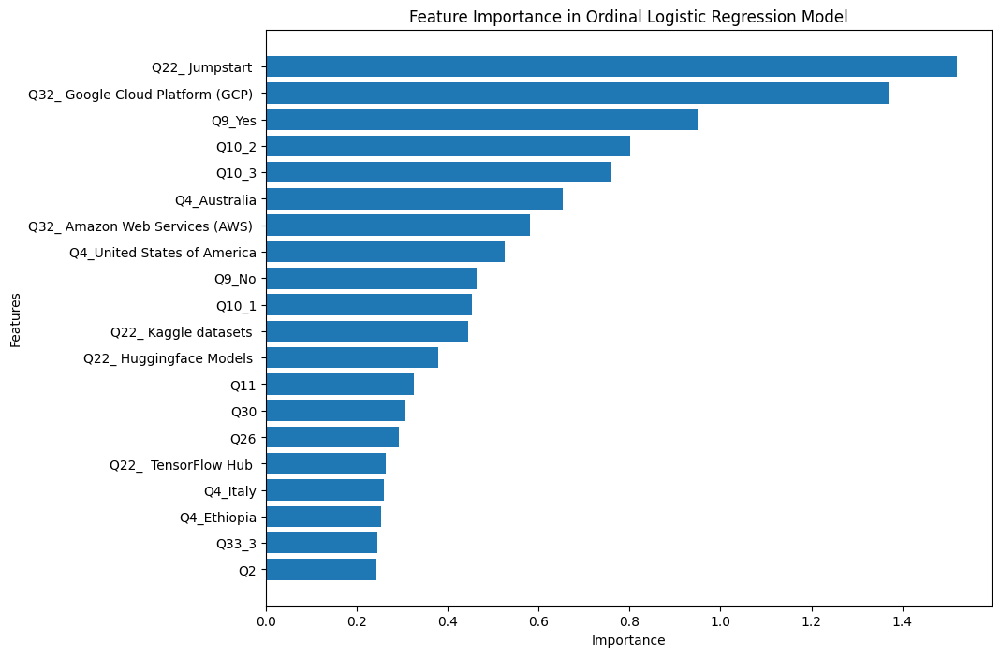

In [779]:
# Empty list to store the coefficients from each model
all_coefficients = []

# Loop over each binary logistic regression model within `OrdinalLogisticRegression`
for model in best_model.models_:
    all_coefficients.append(np.abs(model.coef_).flatten())  # Absolute value of coefficients for each binary model

# mean coefficient across all models to get an overall importance
mean_coefficients = np.mean(all_coefficients, axis=0)

# DataFrame for feature importance
feature_names = X_train_selected.columns
feature_importance = pd.DataFrame({
    'Feature': feature_names,
    'Importance': mean_coefficients
})

# Sort the features by importance
feature_importance = feature_importance.sort_values(by='Importance', ascending=False).head(20)

# Plot the feature importance
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 8))
plt.barh(feature_importance['Feature'], feature_importance['Importance'])
plt.xlabel("Importance")
plt.ylabel("Features")
plt.title("Feature Importance in Ordinal Logistic Regression Model")
plt.gca().invert_yaxis()
plt.show()


# Question 5: Testing

In [780]:
#TODO: Using the best-performing model, evaluate the model performance both on the training set and test set
from sklearn.metrics import accuracy_score, f1_score

# Predict on the training set
y_train_pred = best_model.predict(X_train_selected_scaled)
train_accuracy = accuracy_score(y_train, y_train_pred)
train_f1 = f1_score(y_train, y_train_pred, average='weighted')

# Predict on the test set
y_test_pred = best_model.predict(X_test_selected_scaled)
test_accuracy = accuracy_score(y_test, y_test_pred)
test_f1 = f1_score(y_test, y_test_pred, average='weighted')

# Print the results
print("Training Accuracy:", train_accuracy)
print("Training F1-Score:", train_f1)
print("Test Accuracy:", test_accuracy)
print("Test F1-Score:", test_f1)


Training Accuracy: 0.8784899034240562
Training F1-Score: 0.879833888952084
Test Accuracy: 0.862351495288816
Test F1-Score: 0.8637592911443858


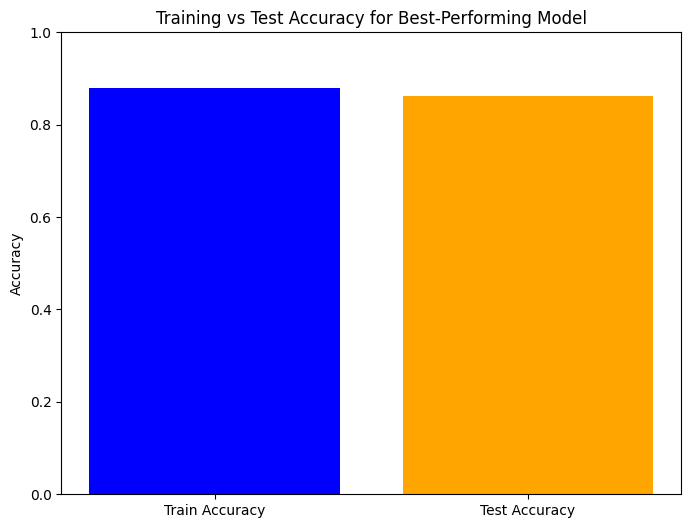

In [781]:
import matplotlib.pyplot as plt


train_accuracy = accuracy_score(y_train, y_train_pred)  # Training accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)     # Test accuracy

# Plotting
plt.figure(figsize=(8, 6))
plt.bar(['Train Accuracy', 'Test Accuracy'], [train_accuracy, test_accuracy], color=['blue', 'orange'])
plt.ylim(0, 1)
plt.ylabel('Accuracy')
plt.title('Training vs Test Accuracy for Best-Performing Model')
plt.show()


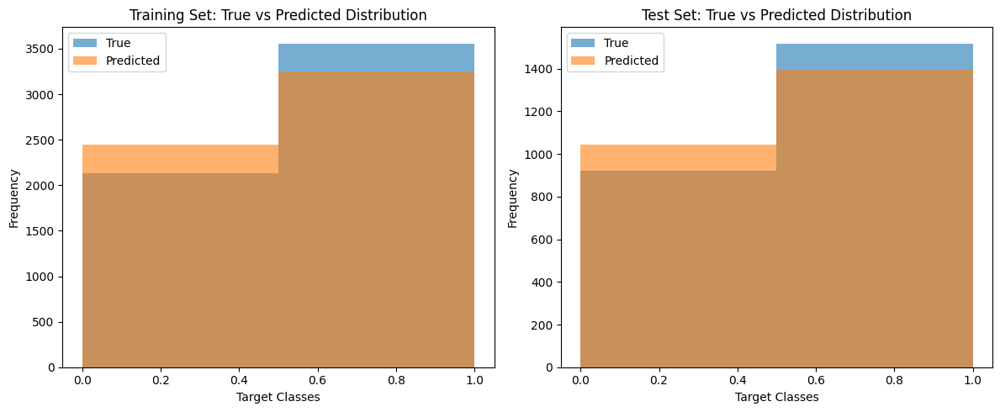

In [782]:
#TODO: Plot the distribution of true target variable values and their predictions on both the training set and test set
import matplotlib.pyplot as plt

# Training set distributions
plt.figure(figsize=(12, 5))

# True target distribution - Training set
plt.subplot(1, 2, 1)
plt.hist(y_train, bins=len(set(y_train)), alpha=0.6, label='True')
plt.hist(y_train_pred, bins=len(set(y_train)), alpha=0.6, label='Predicted')
plt.title("Training Set: True vs Predicted Distribution")
plt.xlabel("Target Classes")
plt.ylabel("Frequency")
plt.legend()

# True target distribution - Test set
plt.subplot(1, 2, 2)
plt.hist(y_test, bins=len(set(y_test)), alpha=0.6, label='True')
plt.hist(y_test_pred, bins=len(set(y_test)), alpha=0.6, label='Predicted')
plt.title("Test Set: True vs Predicted Distribution")
plt.xlabel("Target Classes")
plt.ylabel("Frequency")
plt.legend()

plt.tight_layout()
plt.show()
